In [1]:
!pip install transformers


In [2]:
# from google.colab import drive
# drive.mount('/content/gdrive',force_remount=True)

In [3]:
# import os
# os.chdir('gdrive/MyDrive/VILT/')

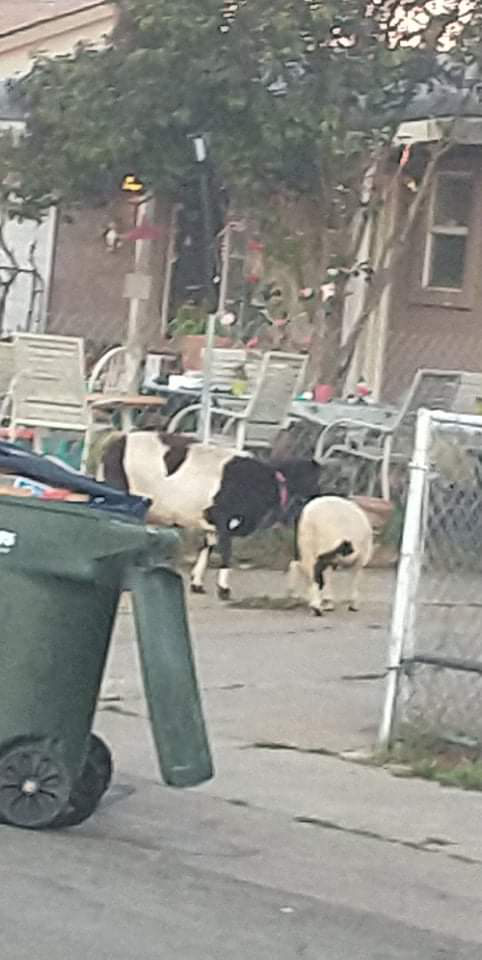

1. What animal is depicted in the image?
Answer: cow

2. How many animals are there in the image?
Answer: 2

3. Describe the coloration and pattern of spots on the animal in the image?
Answer: black and white

4. Does the animal pose any threat? If yes, what threat does it pose?
Answer: yes

5. What threat does the animal pose?
Answer: falling



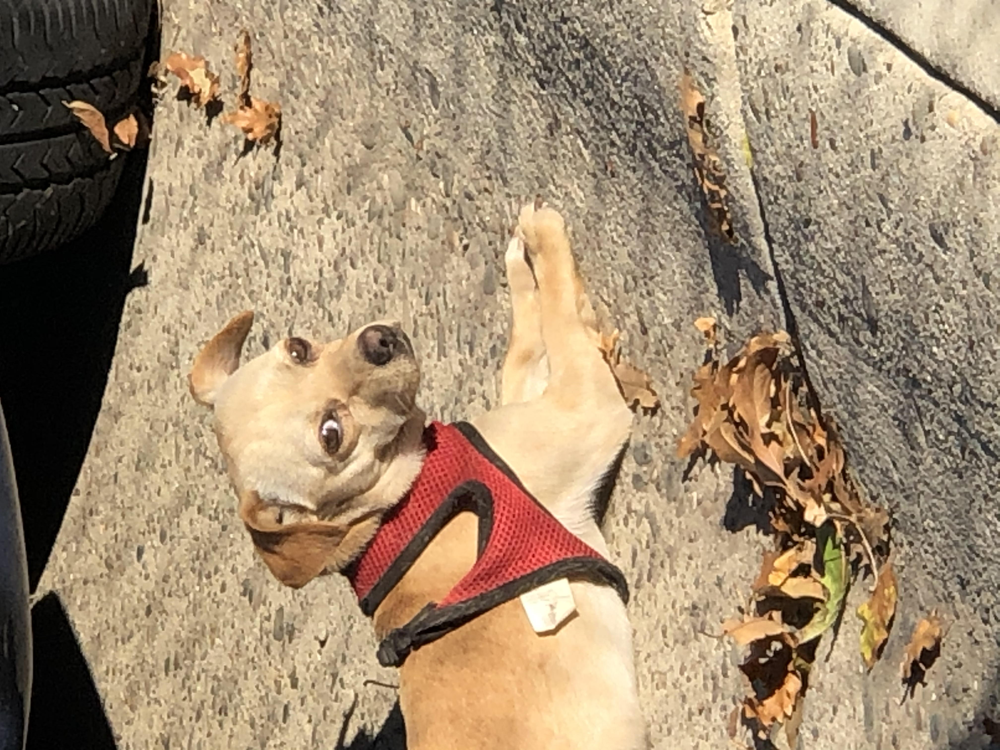

1. What animal is depicted in the image?
Answer: dog

2. How many animals are there in the image?
Answer: 2

3. Describe the coloration and pattern of spots on the animal in the image?
Answer: brown

4. Does the animal pose any threat? If yes, what threat does it pose?
Answer: yes

5. What threat does the animal pose?
Answer: fire



In [6]:
from transformers import ViltProcessor, ViltForQuestionAnswering
import requests
from PIL import Image

def predict_answer(image, question):
    processor = ViltProcessor.from_pretrained("./vilt-b32-finetuned-vqa")
    model = ViltForQuestionAnswering.from_pretrained("./vilt-b32-finetuned-vqa")

    # prepare inputs
    encoding = processor(image, question, return_tensors="pt")

    # forward pass
    outputs = model(**encoding)
    logits = outputs.logits
    idx = logits.argmax(-1).item()
    predicted_answer = model.config.id2label[idx]

    return predicted_answer

# the image URL
url1 = "./Downloads/received_655896782127201.jpeg"
url2 ="./Downloads/C0E71E06-DF34-4164-9D24-5E5C4655ECD1.jpeg"
# image = Image.open(requests.get(url, stream=True).raw)
image = Image.open(url1)
display(image)
# a list of questions
questions = [
    "What animal is depicted in the image?",
    "How many animals are there in the image?",
    "Describe the coloration and pattern of spots on the animal in the image?",
    "Does the animal pose any threat? If yes, what threat does it pose?"
,    "What threat does the animal pose?",
    
#     "Based on the background, where might this location be found? a. farm, b. town",
#     "What other details of background is depicted in the image other than animals?",
#     "What elements in the background of the animals that suggest a specific location?",
#     "Is there any visible evidence of bleeding on the animal shown in the image?",
#     "Where on the depicted animal in the image might this bleeding be located?",
#     "On which part of the animal's body shown in the image is the bleeding be found?",
#     "What type of injury to the animal is observable in the image?",
#     "What kind of injury to the animal is evident from the image?",
#     "What form of injury to the animal is apparent in the image?",
#     "What is the visible injury to the animal depicted in the image?",
]


# processing each question at a time
for i, question in enumerate(questions):
    answer = predict_answer(image, question)

    print(f"{i + 1}. {question}")
    print(f"Answer: {answer}\n")
image = Image.open(url2)
display(image)
# processing each question at a time
for i, question in enumerate(questions):
    answer = predict_answer(image, question)

    print(f"{i + 1}. {question}")
    print(f"Answer: {answer}\n")